## scVelo analysis TECs with gene selection

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import os
import hdf5plugin
import pandas as pd
import anndata as ad

In [2]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.set_figure_params()
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())

In [3]:
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')


In [4]:
# Add repo path to sys path (allows to access scripts and metadata from repo)
import sys
repo_path = os.path.split(os.getcwd())[0]
sys.path.insert(1, repo_path) 
sys.path.insert(2, '/lustre/scratch126/cellgen/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/scripts')

# Define plot and path dirs
plot_path = os.path.join(repo_path, 'plots')
data_path = os.path.join(repo_path, 'data')
model_path = os.path.join(repo_path, 'models')
general_data_path = '/lustre/scratch126/cellgen/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/data'

In [5]:
tec_mrkrs = {'pan-cTEC':['PSMB11', 'LY75', 'CCL25', 'HLA-DRA'],
        'cTEC\nsubtypes':['DLL4', 'TP53AIP1', 'TBATA'],
        'mcTEC':['DLK2','IGFBP5', 'IGFBP6','CCN2', 'CCL2',
              'KRT15', 'ITGA6', 'MKI67'],
        'pan-mTEC': ['EPCAM'],
        'mTECI': ['ASCL1','CCL21'],
        'mTECII': ['AIRE', 'FEZF2','CRIP1'], 
        'mTECIII':['SLPI', 'IVL', 'KRT10','CDKN2A'],
        'pan-neuro TEC': ['BEX1', 'NEUROD1'],
        'neuroTEC': ['NEUROG1', 'NEUROD4'], 
        'cilliated TEC': ['PCP4', 'FOXJ1'], 
        'myoTEC':['CHRNA1', 'MYOG', 'TTN'],
        'ionocytes':['FOXI1', 'CFTR'],
        'tuft cells':['POU2F3','PLCB2', 'TRPM5']}
tec_mrkrs_list = []
[tec_mrkrs_list.extend(tec_mrkrs[key]) for key in tec_mrkrs.keys()]

[None, None, None, None, None, None, None, None, None, None, None, None, None]

### Load the data

In [6]:
adata_vc_tec_full = ad.read_h5ad(f'{data_path}/ThyAge_TEC_velocyto_2025-03-22.zarr')

In [7]:
sum(adata_vc_tec_full.obs['taa_l3'].isnull())

0

In [8]:
adata_vc_tec_full.obs['taa_l3'].cat.categories

Index(['TEC-EMT', 'TEC-mim', 'cTEC', 'mTECI', 'mTECII', 'mTECIII', 'mcTEC'], dtype='object')

In [9]:
adata_vc_tec = adata_vc_tec_full[adata_vc_tec_full.obs['taa_l3'].isin(['cTEC', 'mcTEC', 'mTECI','TEC-EMT']),]

In [10]:
adata_vc_tec_full.shape
adata_vc_tec.shape

(79882, 35530)

(66081, 35530)

In [11]:
from utils_vk8 import regen_embed

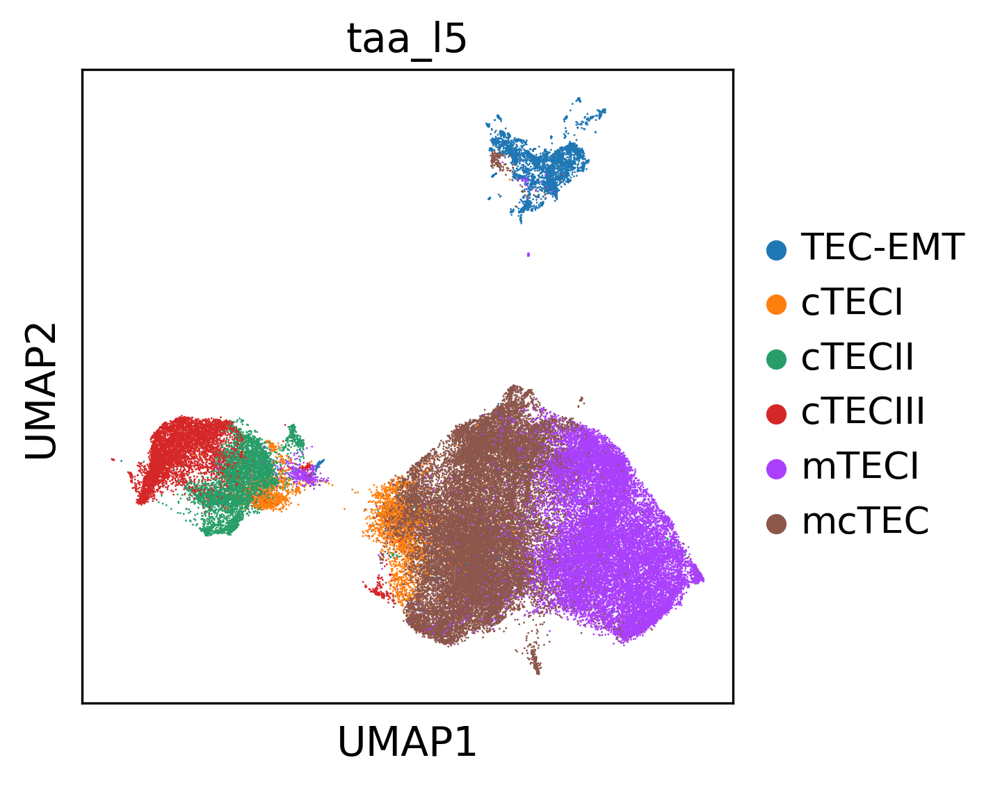

AnnData object with n_obs × n_vars = 66081 × 35530
    obs: 'sample', 'library', 'index', 'barcode', 'library_tcr_ab', 'library_tcr_gd', 'library_bcr', 'path_raw_gex', 'starsolo_version', 'path_cellbender_gex', 'path_cellranger_arc', 'donor', 'chemistry_simple', 'chemistry_detail', 'chemistry_orig', 'origin_institute', 'research_no', 'study', 'sort', 'sort_type', 'in_HTSA', 'public_data', 'type', 'cite', 'health_status', 'age_group', 'age_group2', 'age_group3', 'age', 'age_num', 'age_unit', 'age_cont', 'sex', 'age_months', 'path_tcr_ab', 'path_tcr_gd', 'path_bcr', 'comment', 'batch', 'taa_l5', 'taa_l4', 'taa_l3', 'taa_l2', 'taa_l1', 'taa_l0', 'pri_anno'
    var: 'gene_id', 'gene_name', 'modality'
    uns: 'neighbors', 'umap', 'taa_l5_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [12]:
regen_embed(adata_vc_tec, 'taa_l5')

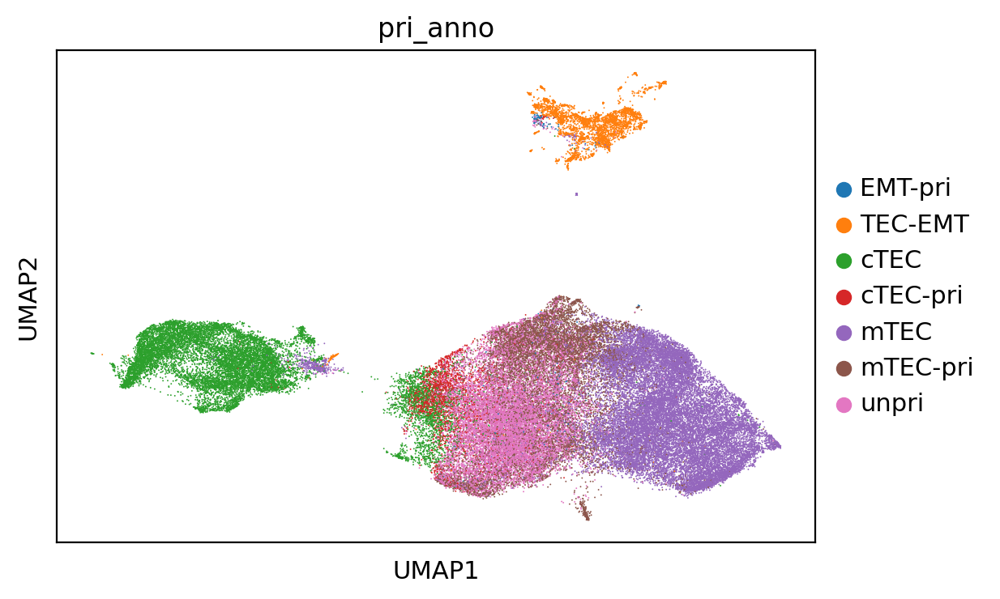

In [48]:
sc.pl.umap(adata_vc_tec, color = 'pri_anno')

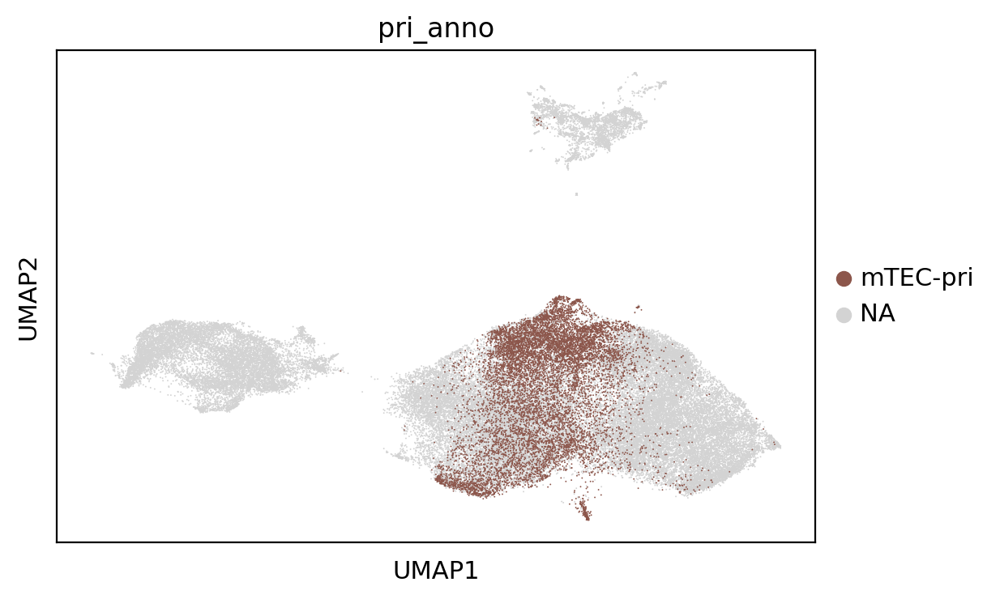

In [49]:
sc.pl.umap(adata_vc_tec, color = 'pri_anno', groups = ['mTEC-pri'])

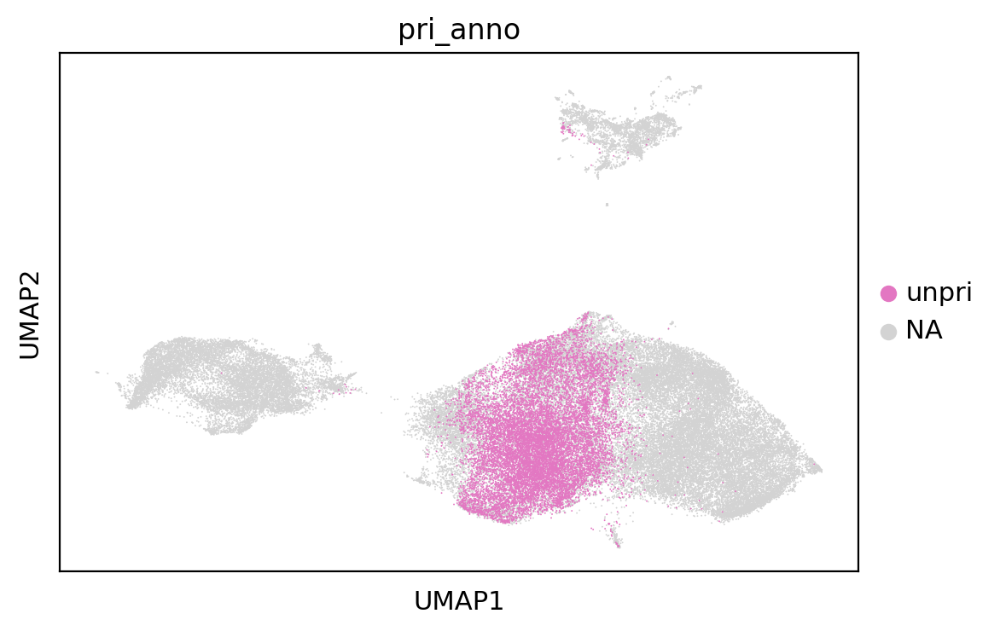

In [50]:
sc.pl.umap(adata_vc_tec, color = 'pri_anno', groups = ['unpri'])

In [13]:
def gene_selection (adata, ctype_anno, sel_type = 'top_markers', topGenes=500, main_markers = []):
    if sel_type == 'top_markers':
        print("Training on the top markers for each population:")
        genes = []
        counts = {}
        adata_train = adata.copy()
        sc.pp.normalize_total(adata_train, target_sum=1e4)
        sc.pp.log1p(adata_train)
        sc.tl.rank_genes_groups(adata_train, groupby=ctype_anno)
        for ct in adata_train.obs[ctype_anno].unique():
            marker_genes = sc.get.rank_genes_groups_df(adata_train, ct, pval_cutoff=0.05, log2fc_min=0.5)
            counts[ct]= marker_genes.shape[0]
            if marker_genes.shape[0] > topGenes:
                genes += marker_genes['names'][0:topGenes].tolist()
            else:
                genes += marker_genes['names'].tolist()
        genes = list(set(genes))
        print(f'Gene selction using markers, picked {len(genes)} genes, see dropdown {counts}')
        hv_genes = list(set(genes+main_markers))
       # adata_train = adata_train[:, adata_train.var_names.isin(genes+main_markers)].copy()
        del adata_train
        return (hv_genes)

In [34]:
import gc
gc.collect()

190135

In [14]:
hv_genes = gene_selection(adata=adata_vc_tec, ctype_anno = 'taa_l5', sel_type = 'top_markers', topGenes=800, 
                              main_markers = tec_mrkrs_list)

Training on the top markers for each population:
Gene selction using markers, picked 3393 genes, see dropdown {'mcTEC': 2326, 'mTECI': 3555, 'cTECIII': 2300, 'TEC-EMT': 3079, 'cTECI': 4638, 'cTECII': 4618}


In [16]:
len(hv_genes)

3412

In [20]:
del adata_vc_tec.obsp

In [21]:
adata_vc_tec = adata_vc_tec[:,adata_vc_tec.var_names.isin(hv_genes)].copy()

In [22]:
adata_vc_tec.shape

(66081, 3413)

In [23]:
#scv.pp.filter_and_normalize(adata_vc_tec, min_shared_counts=20)
scv.pp.filter_genes(adata_vc_tec, min_shared_counts=20)
scv.pp.normalize_per_cell(adata_vc_tec)
#scv.pp.filter_genes_dispersion(adata_vc_tec, n_top_genes=3000)
scv.pp.log1p(adata_vc_tec)

Filtered out 238 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


In [24]:
adata_inf = adata_vc_tec[adata_vc_tec.obs['age_group'] == 'infant'].copy()
adata_paed = adata_vc_tec[adata_vc_tec.obs['age_group'] == 'paed'].copy()
adata_adult = adata_vc_tec[adata_vc_tec.obs['age_group'] == 'adult'].copy()

#Try scvelo functions instead

In [25]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [26]:
scv.pp.moments(adata_vc_tec, n_neighbors=30, use_rep = 'X_scVI')

computing neighbors
    finished (0:00:17) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:23) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [28]:
adata_vc_tec

AnnData object with n_obs × n_vars = 66081 × 3175
    obs: 'sample', 'library', 'index', 'barcode', 'library_tcr_ab', 'library_tcr_gd', 'library_bcr', 'path_raw_gex', 'starsolo_version', 'path_cellbender_gex', 'path_cellranger_arc', 'donor', 'chemistry_simple', 'chemistry_detail', 'chemistry_orig', 'origin_institute', 'research_no', 'study', 'sort', 'sort_type', 'in_HTSA', 'public_data', 'type', 'cite', 'health_status', 'age_group', 'age_group2', 'age_group3', 'age', 'age_num', 'age_unit', 'age_cont', 'sex', 'age_months', 'path_tcr_ab', 'path_tcr_gd', 'path_bcr', 'comment', 'batch', 'taa_l5', 'taa_l4', 'taa_l3', 'taa_l2', 'taa_l1', 'taa_l0', 'pri_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_id', 'gene_name', 'modality', 'gene_count_corr'
    uns: 'neighbors', 'umap', 'taa_l5_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

In [29]:
scv.tl.velocity(adata_vc_tec, mode = 'stochastic', use_highly_variable=False)

computing velocities
    finished (0:00:23) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [30]:
adata_vc_tec

AnnData object with n_obs × n_vars = 66081 × 3175
    obs: 'sample', 'library', 'index', 'barcode', 'library_tcr_ab', 'library_tcr_gd', 'library_bcr', 'path_raw_gex', 'starsolo_version', 'path_cellbender_gex', 'path_cellranger_arc', 'donor', 'chemistry_simple', 'chemistry_detail', 'chemistry_orig', 'origin_institute', 'research_no', 'study', 'sort', 'sort_type', 'in_HTSA', 'public_data', 'type', 'cite', 'health_status', 'age_group', 'age_group2', 'age_group3', 'age', 'age_num', 'age_unit', 'age_cont', 'sex', 'age_months', 'path_tcr_ab', 'path_tcr_gd', 'path_bcr', 'comment', 'batch', 'taa_l5', 'taa_l4', 'taa_l3', 'taa_l2', 'taa_l1', 'taa_l0', 'pri_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_id', 'gene_name', 'modality', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'umap', 'taa_l5_colors', 'velocity_params'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'ambiguou

In [31]:
scv.tl.velocity_graph(adata_vc_tec, n_jobs = 5)

computing velocity graph (using 5/256 cores)


  0%|          | 0/66081 [00:00<?, ?cells/s]

    finished (0:03:33) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [43]:
adata_vc_tec.obs['pri_anno']

names
A16_TH_TOT_5GEX_6-AGGGTGACAAGTTGTC      mTEC-pri
A16_TH_TOT_5GEX_6-CTACATTAGTACACCT      mTEC-pri
A16_TH_TOT_5GEX_7-CTGAAACCAAGCGCTC         unpri
A16_TH_TOT_5GEX_8-AACGTTGAGCCAGTTT          mTEC
A16_TH_TOT_5GEX_8-CTGATAGTCCTGTAGA          mTEC
                                          ...   
ThDefineAImm8813477-TTTGTCAAGATATGGT    mTEC-pri
ThDefineAImm8813477-TTTGTCAAGGAGTACC    mTEC-pri
ThDefineAImm8813477-TTTGTCAAGTCAAGGC    mTEC-pri
ThDefineAImm8813477-TTTGTCATCCGTCAAA    mTEC-pri
ThDefineAImm8813477-TTTGTCATCGAGCCCA        mTEC
Name: pri_anno, Length: 66081, dtype: category
Categories (7, object): ['EMT-pri', 'TEC-EMT', 'cTEC', 'cTEC-pri', 'mTEC', 'mTEC-pri', 'unpri']

computing velocity embedding
    finished (0:00:21) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/team205/vk8/projects/thymus_ageing_atlas/TEC_compartment/plots/Thy_TEC_main_scvelo_stochastic.pdf


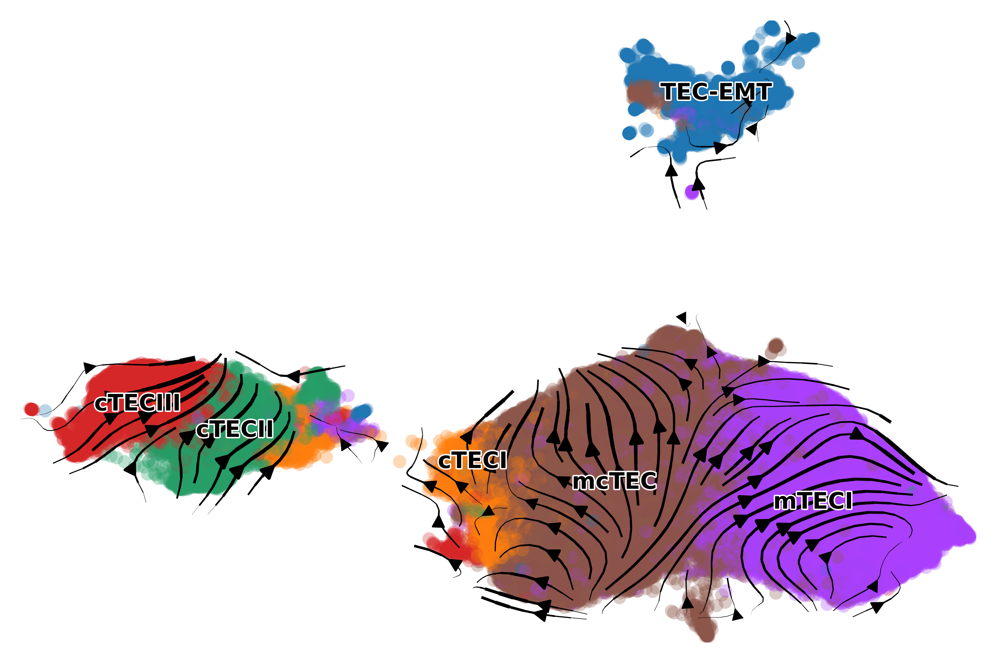

In [33]:
scv.pl.velocity_embedding_stream(adata_vc_tec, basis='umap', color = 'taa_l5', legend_fontsize = 8, 
                                save = f'{plot_path}/Thy_TEC_main_scvelo_stochastic.pdf', dpi = 300, title ='')

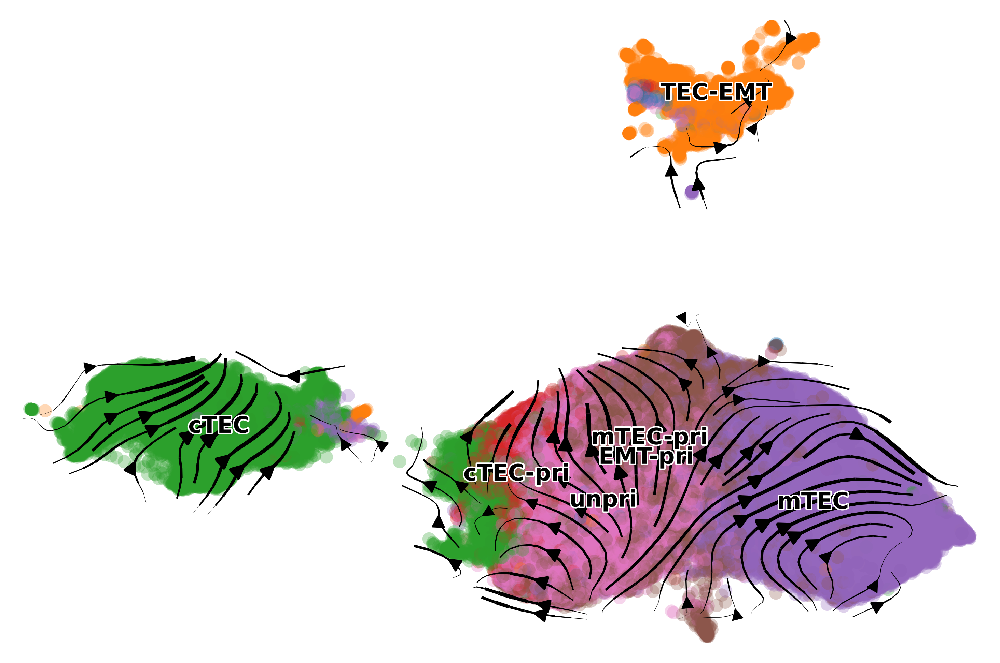

In [44]:
scv.pl.velocity_embedding_stream(adata_vc_tec, basis='umap', color = 'pri_anno', legend_fontsize = 8, 
                               dpi = 300, title ='')

saving figure to file /nfs/team205/vk8/projects/thymus_ageing_atlas/TEC_compartment/plots/Thy_TEC_main_scvelo_stochastic.svg


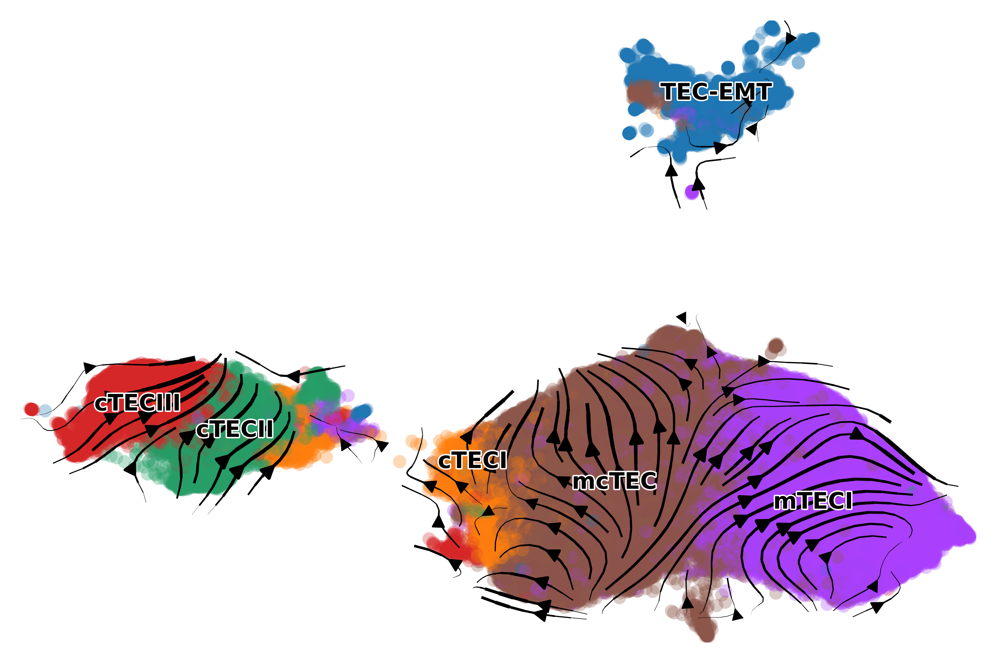

In [34]:
scv.pl.velocity_embedding_stream(adata_vc_tec, basis='umap', color = 'taa_l5', legend_fontsize = 8, 
                                save = f'{plot_path}/Thy_TEC_main_scvelo_stochastic.svg', dpi = 300, title ='')

In [35]:
def run_velocity(adata, ctype = 'taa_l5', mode = 'stochastic', n_cpus = 5, save_name=''):
    scv.pp.moments(adata, n_neighbors=30, use_rep = 'X_scVI')
    if mode == 'stochastic':
        scv.tl.velocity(adata, mode = 'stochastic', use_highly_variable=False)
    elif mode == 'dynamical':
        scv.tl.recover_dynamics(adata, n_jobs = n_cpus)
    scv.tl.velocity_graph(adata, n_jobs = n_cpus)
    scv.pl.velocity_embedding_stream(adata, basis='umap', color = ctype, legend_fontsize = 8, 
                                save = f'{plot_path}/Thy_{save_name}_scvelo_stochastic.svg', dpi = 300, title ='')

computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 5/256 cores)


  0%|          | 0/17851 [00:00<?, ?cells/s]

    finished (0:00:42) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/team205/vk8/projects/thymus_ageing_atlas/TEC_compartment/plots/Thy_TEC_main_infant_scvelo_stochastic.svg


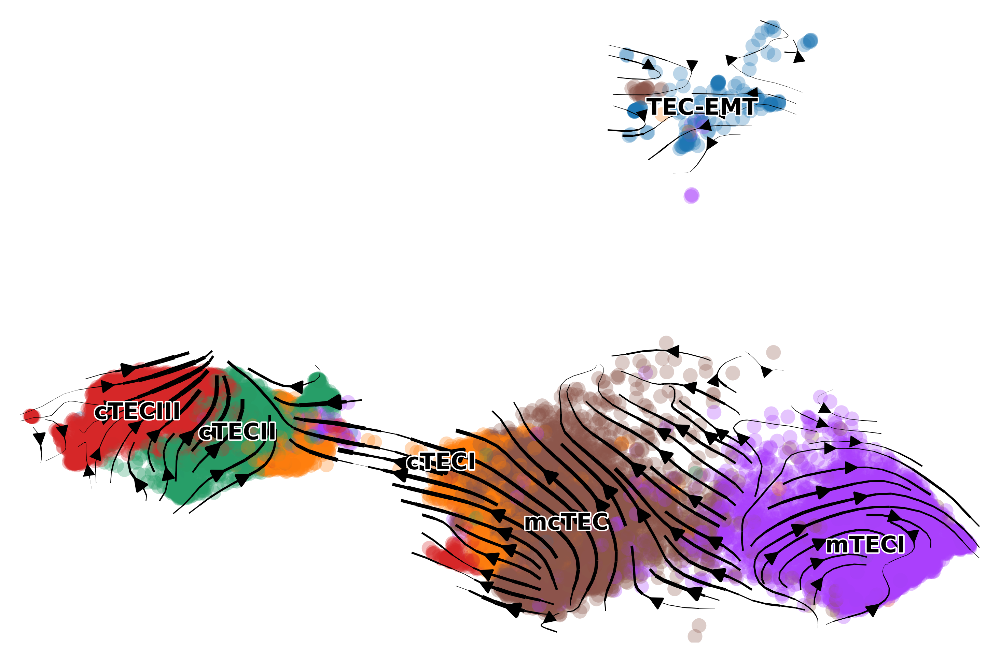

In [36]:
run_velocity(adata_inf, ctype = 'taa_l5', mode = 'stochastic', n_cpus = 5, save_name='TEC_main_infant')

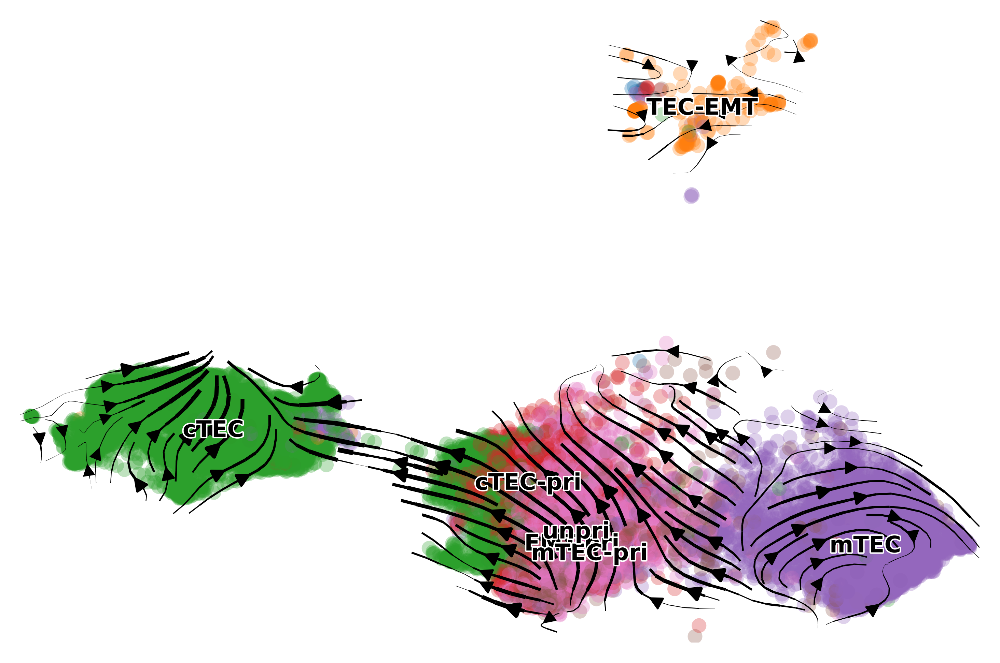

In [45]:
scv.pl.velocity_embedding_stream(adata_inf, basis='umap', color = 'pri_anno', legend_fontsize = 8, dpi = 300, title ='')

computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 5/256 cores)


  0%|          | 0/26423 [00:00<?, ?cells/s]

    finished (0:01:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/team205/vk8/projects/thymus_ageing_atlas/TEC_compartment/plots/Thy_TEC_main_paed_scvelo_stochastic.svg


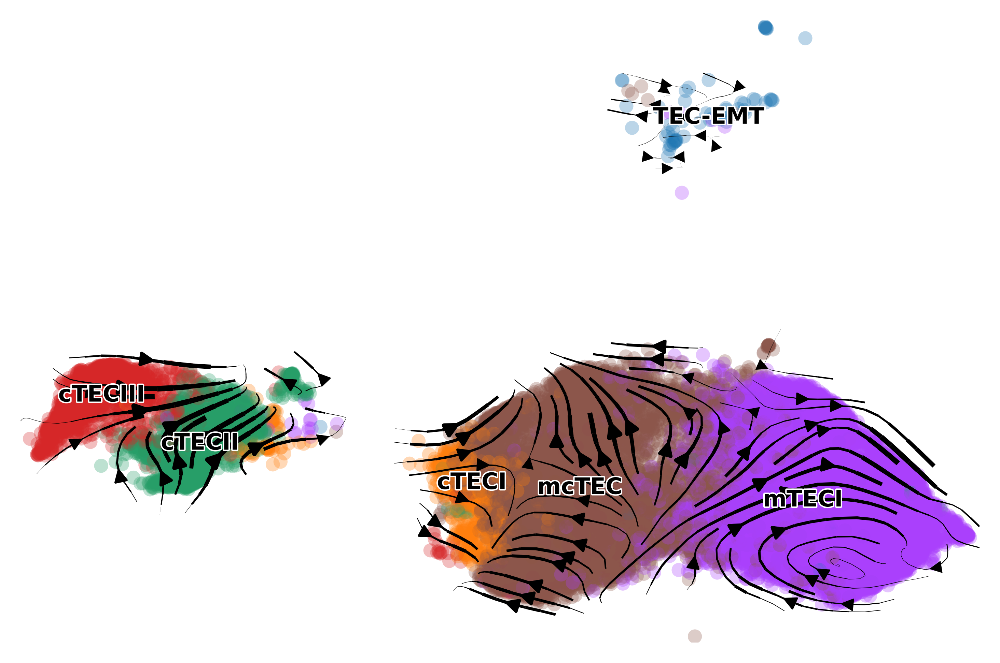

In [37]:
run_velocity(adata_paed, ctype = 'taa_l5', mode = 'stochastic', n_cpus = 5, save_name='TEC_main_paed')

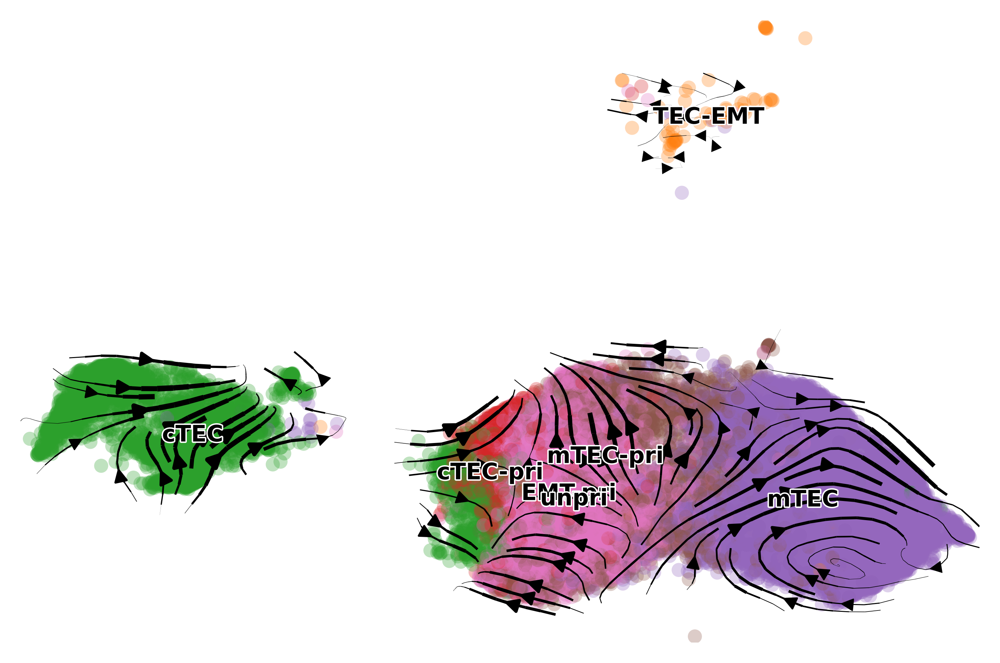

In [46]:
scv.pl.velocity_embedding_stream(adata_paed, basis='umap', color = 'pri_anno', legend_fontsize = 8, dpi = 300, title ='')

computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:06) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 5/256 cores)


  0%|          | 0/21594 [00:00<?, ?cells/s]

    finished (0:00:44) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/team205/vk8/projects/thymus_ageing_atlas/TEC_compartment/plots/Thy_TEC_main_adult_scvelo_stochastic.svg


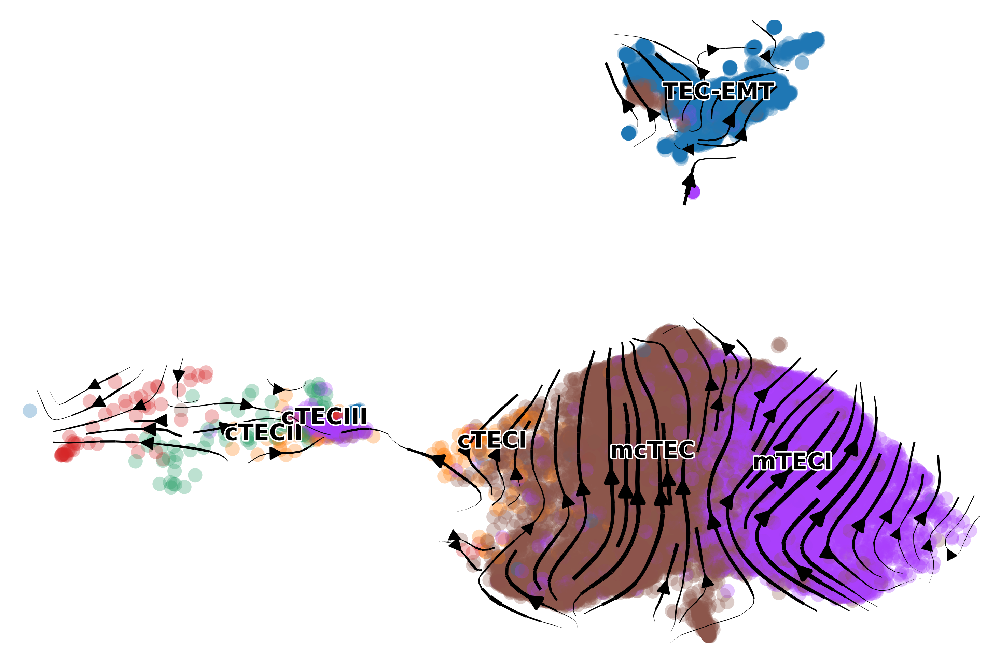

In [38]:
run_velocity(adata_adult, ctype = 'taa_l5', mode = 'stochastic', n_cpus = 5, save_name='TEC_main_adult')

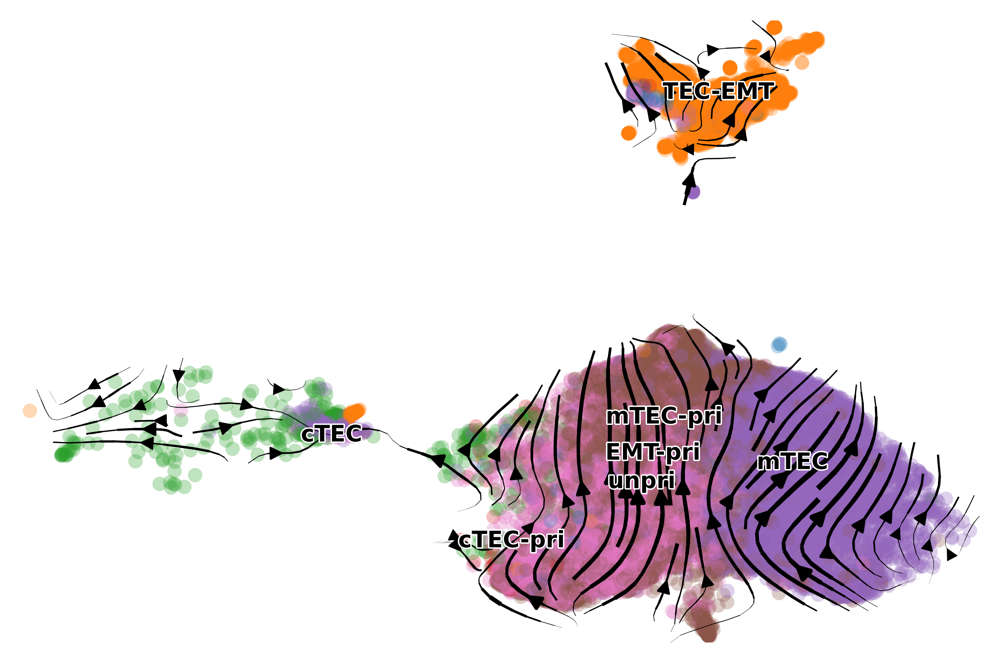

In [47]:
scv.pl.velocity_embedding_stream(adata_adult, basis='umap', color = 'pri_anno', legend_fontsize = 8, dpi = 300, title ='')

In [39]:
velocity_res={}
velocity_res['TEC_all'] = {'Ms':adata_vc_tec.layers['Ms'], 'Mu':adata_vc_tec.layers['Mu'], 
                          'velocity':adata_vc_tec.layers['velocity'], 'variance_velocity':adata_vc_tec.layers['variance_velocity']}
velocity_res['TEC_inf'] = {'Ms':adata_inf.layers['Ms'], 'Mu':adata_inf.layers['Mu'], 
                          'velocity':adata_inf.layers['velocity'], 'variance_velocity':adata_inf.layers['variance_velocity']}
velocity_res['TEC_paed'] = {'Ms':adata_paed.layers['Ms'], 'Mu':adata_paed.layers['Mu'], 
                          'velocity':adata_paed.layers['velocity'], 'variance_velocity':adata_paed.layers['variance_velocity']}
velocity_res['TEC_adult'] = {'Ms':adata_adult.layers['Ms'], 'Mu':adata_adult.layers['Mu'], 
                          'velocity':adata_adult.layers['velocity'], 'variance_velocity':adata_adult.layers['variance_velocity']}

import pickle
with open (f'{data_path}/ThyAge_TEC_selmain_scvelo_stochastic_age_groups.pickle', 'wb') as file:
    pickle.dump(velocity_res, file)

In [59]:
tec_mrkrs = {'pan-cTEC':['PSMB11', 'LY75', 'CCL25', 'HLA-DRA'],
        'cTEC\nsubtypes':['DLL4', 'TP53AIP1', 'TBATA'],
        'mcTEC':['DLK2','IGFBP5', 'IGFBP6','CCN2', 'CCL2',
              'KRT15', 'ITGA6', 'MKI67'],
        'pan-mTEC': ['EPCAM'],
        'mTECI': ['ASCL1','CCL21'],
        'mTECII': ['AIRE', 'FEZF2','CRIP1'], 
        'mTECIII':['SLPI', 'IVL', 'KRT10','CDKN2A'],
        'pan-neuro TEC': ['BEX1', 'NEUROD1'],
        'neuroTEC': ['NEUROG1', 'NEUROD4'], 
        'cilliated TEC': ['PCP4', 'FOXJ1'], 
        'myoTEC':['CHRNA1', 'MYOG', 'TTN'],
        'ionocytes':['FOXI1', 'CFTR'],
        'tuft cells':['POU2F3','PLCB2', 'TRPM5']}
tec_mrkrs_list = []
[tec_mrkrs_list.extend(tec_mrkrs[key]) for key in tec_mrkrs.keys()]

[None, None, None, None, None, None, None, None, None, None, None, None, None]

In [60]:
mrkrs = [i for i in tec_mrkrs_list if i in adata_vc_tec.var_names]

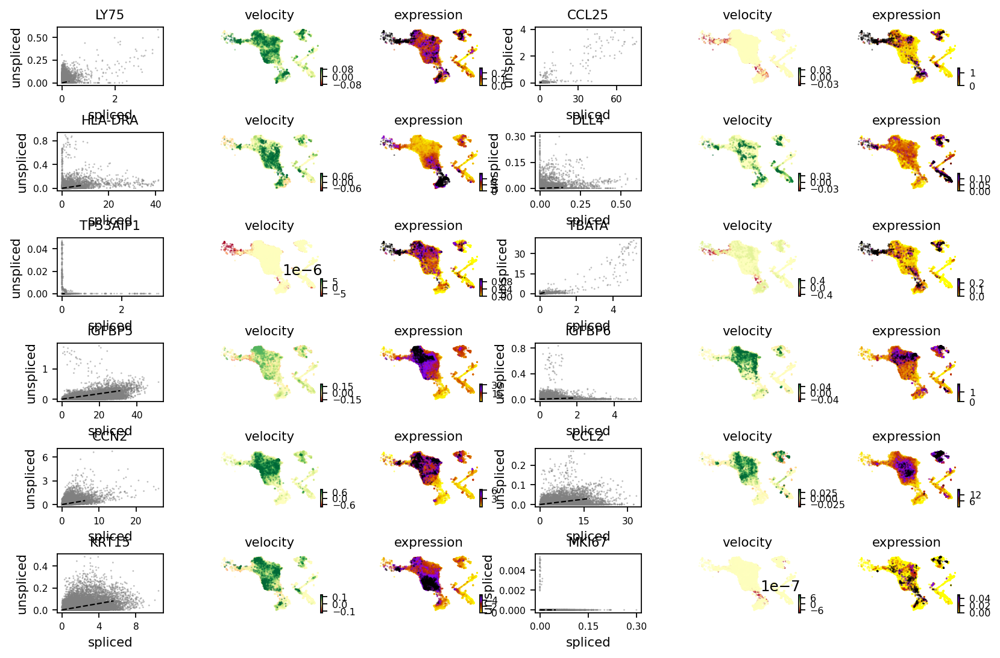

In [62]:
scv.pl.velocity(adata_adult, mrkrs[0:12], ncols=2)